In [3]:
!git clone https://github.com/pedromperezc/proyecto-especializacion-ceia.git

fatal: destination path 'proyecto-especializacion-ceia' already exists and is not an empty directory.


In [2]:
try:
  
  import detectron2


except ImportError:
  # detectron2  installation
  !pip install pyyaml==5.1
  # workaround: install old version of pytorch since detectron2 hasn't released packages for pytorch 1.9 (issue: https://github.com/facebookresearch/detectron2/issues/3158)

  !pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

  

  !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html

  exit(0) # restarts runtime


     |████████████████████████████████| 274 kB 13.0 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=a1004c231e0d64ad06f5a36748e6fd0f23c2389d8249265b8b6cf56e3ba6288e
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 763.5 MB 15 kB/s 
     |████████████████████████████████| 17.3 MB 169 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Success

In [1]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.8")   # please manually install torch 1.8 if Colab changes its default version

# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

1.8.0+cu101 True


<Logger detectron2 (DEBUG)>

In [4]:
import cv2
import numpy as np
import os
from pathlib import Path
import pickle
import sys

## detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import (
    DatasetCatalog,
    MetadataCatalog,
)
from detectron2.engine import DefaultTrainer, DefaultPredictor

from ceia.src import data_utils, visualize

%matplotlib inline

In [5]:
EXPERIMENT_NAME = 'particle' # can be 'particle' or 'satellite'
root = Path('ceia','src','datasets') # path to folder  containing labels
json_path_train = Path(root,'label', 'train_project_1Sep2021.json')  # path to training data
json_path_val = Path(root,'imagen', 'via_project_1Sep2021.json')  # path to validation data

assert json_path_train.is_file(), 'training file not found!'
assert json_path_val.is_file(), 'validation file not found!'

In [6]:
DatasetCatalog.clear()  # resets catalog, helps prevent errors from running cells multiple times

# store names of datasets that will be registered for easier access later
dataset_train = f'{EXPERIMENT_NAME}_Train'
dataset_valid = f'{EXPERIMENT_NAME}_Val'

# register the training dataset
DatasetCatalog.register(dataset_train, 
                        lambda f = json_path_train: data_utils.get_ddicts(label_fmt='via2',  # annotations generated from vgg image annotator
                                                                          im_root=f,  # path to the training data json file
                                                                          dataset_class='Train'))  # indicates this is training data

# register the validation dataset. Same exact process as above
DatasetCatalog.register(dataset_valid, 
                        lambda f = json_path_val: data_utils.get_ddicts(label_fmt='via2',  # annotations generated from vgg image annotator
                                                                        im_root=f,  # path to validation data json file
                                                                        dataset_class='Validation'))  # indicates this is validation data
print(f'Registered Datasets: {list(DatasetCatalog.data.keys())}')

## There is also a metadata catalog, which stores the class names.
for d in [dataset_train, dataset_valid]:
    MetadataCatalog.get(d).set(**{'thing_classes': [EXPERIMENT_NAME]})

Registered Datasets: ['particle_Train', 'particle_Val']


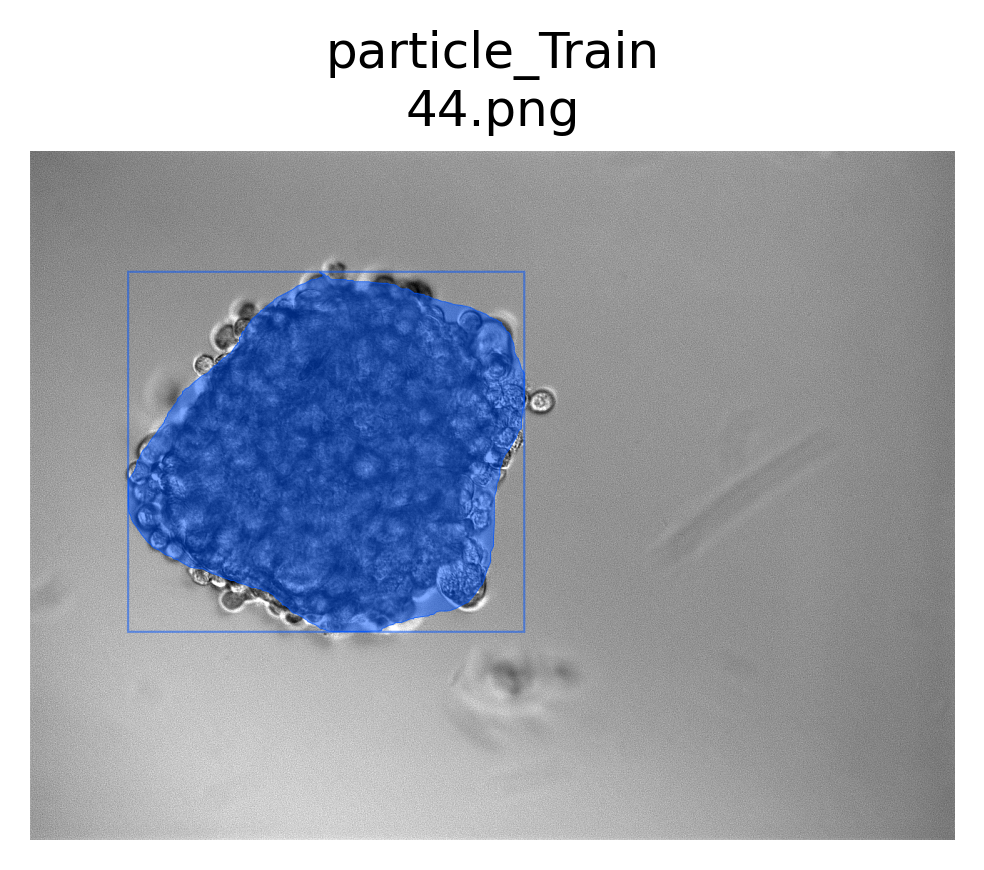

ddict info:
	path: ceia/src/datasets/label/44.png
	num_instances: 1


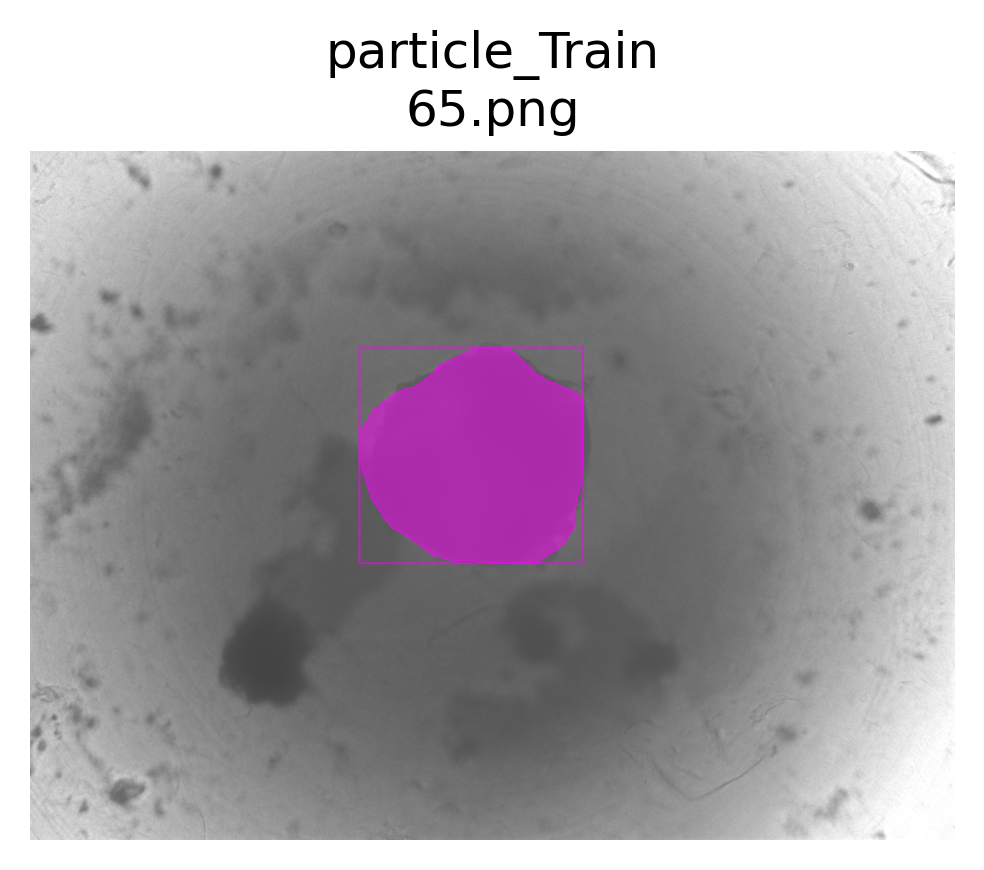

ddict info:
	path: ceia/src/datasets/label/65.png
	num_instances: 1


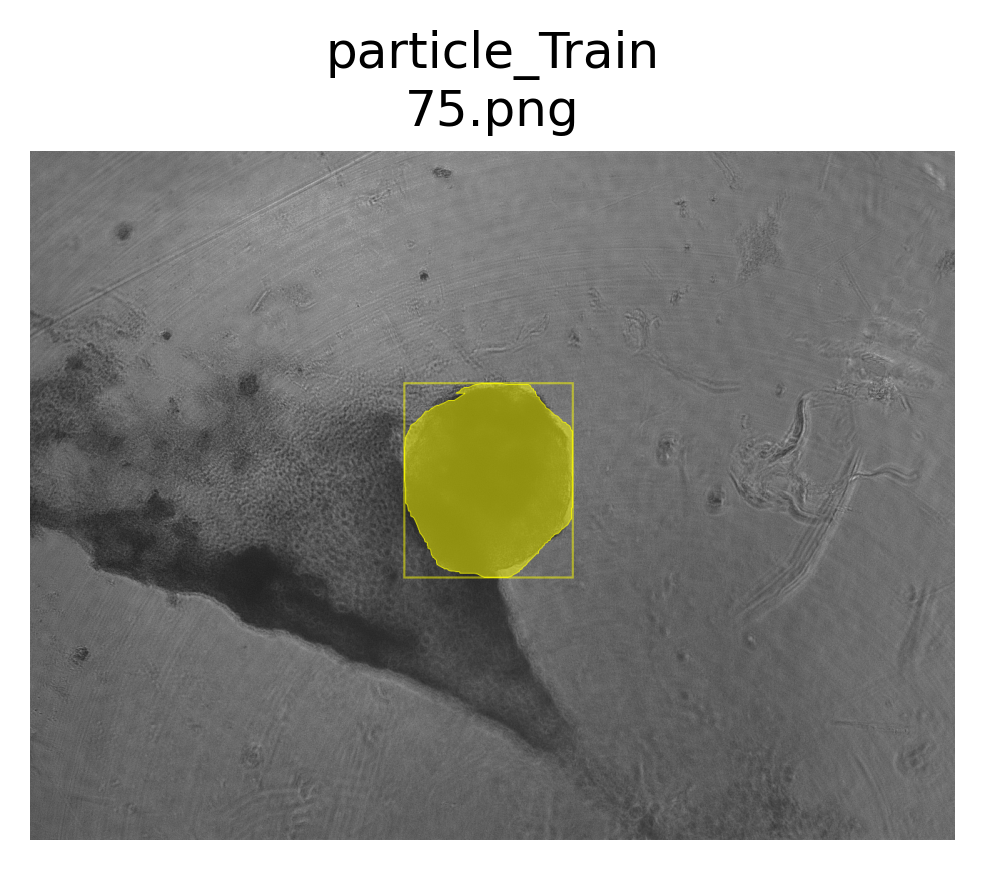

ddict info:
	path: ceia/src/datasets/label/75.png
	num_instances: 1


In [7]:
np.random.seed(42960)
for i in np.random.choice(DatasetCatalog.get(dataset_train), 3, replace=False):
    visualize.display_ddicts(i, None, dataset_train, suppress_labels=True)



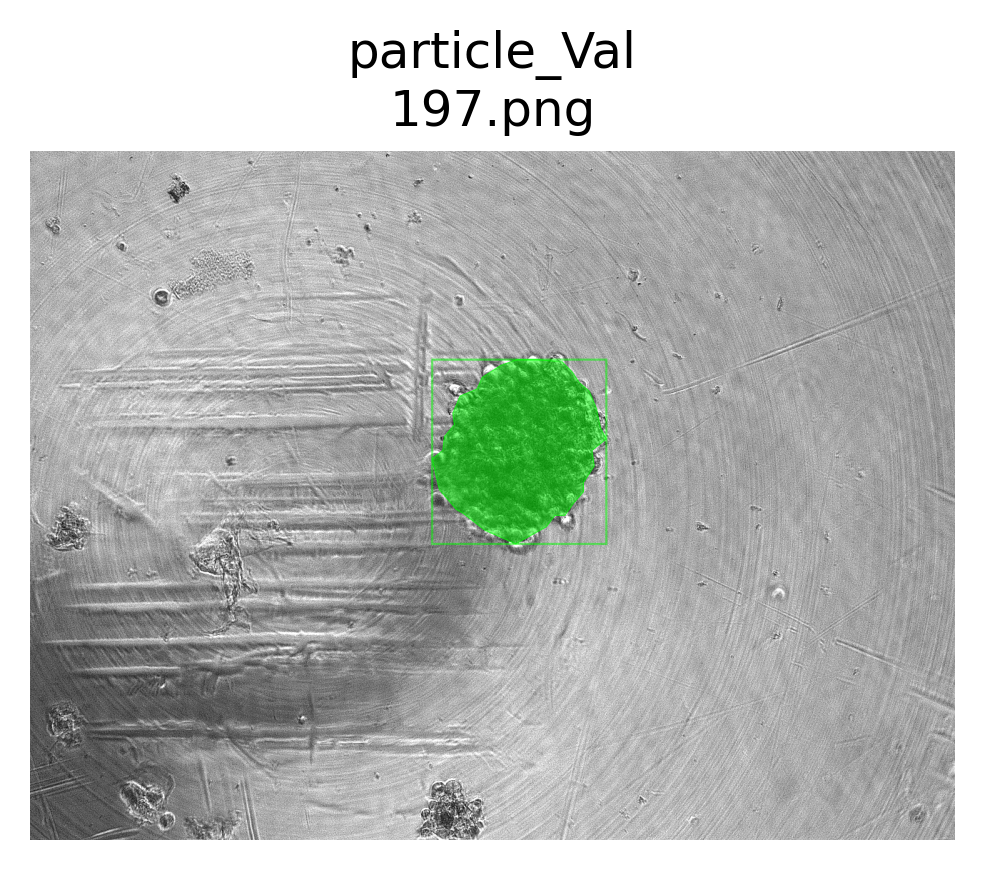

ddict info:
	path: ceia/src/datasets/imagen/197.png
	num_instances: 1


In [9]:
for i in DatasetCatalog.get(dataset_valid):
    visualize.display_ddicts(i, None, dataset_valid, suppress_labels=True)

In [29]:
cfg = get_cfg() # initialize cfg object
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'))  # load default parameters for Mask R-CNN
cfg.INPUT.MASK_FORMAT = 'polygon'  # masks generated in VGG image annotator are polygons
cfg.DATASETS.TRAIN = (dataset_train,)  # dataset used for training model
cfg.DATASETS.TEST = (dataset_train, dataset_valid)  # we will look at the predictions on both sets after training
cfg.SOLVER.IMS_PER_BATCH = 1 # number of images per batch (across all machines)
cfg.SOLVER.CHECKPOINT_PERIOD = 400  # number of iterations after which to save model checkpoints
cfg.MODEL.DEVICE='cuda'  # 'cpu' to force model to run on cpu, 'cuda' if you have a compatible gpu
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 # Since we are training separate models for particles and satellites there is only one class output
cfg.TEST.DETECTIONS_PER_IMAGE = 1 if EXPERIMENT_NAME == 'particle' else 1  # maximum number of instances that can be detected in an image (this is fixed in mask r-cnn)
cfg.SOLVER.MAX_ITER = 2000  # maximum number of iterations to run during training
num_gpu = 1
bs = (num_gpu * 2)
cfg.SOLVER.BASE_LR = 0.02 * bs / 16
  # Increasing this may improve the training results, but will take longer to run (especially without a gpu!)

# model weights will be downloaded if they are not present
weights_path = Path('model_final_f10217.pkl')
if weights_path.is_file():
    print('Using locally stored weights: {}'.format(weights_path))
else:
    weights_path = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
    print('Weights not found, weights will be downloaded from source: {}'.format(weights_path))
cfg.MODEL.WEIGHTs = str(weights_path)
cfg.OUTPUT_DIR = str(Path(f'{EXPERIMENT_NAME}_output'))
# make the output directory
os.makedirs(Path(cfg.OUTPUT_DIR), exist_ok=True)

Using locally stored weights: model_final_f10217.pkl


In [30]:
# note this cell generates a huge wall of text
trainer = DefaultTrainer(cfg)  # create trainer object from cfg
trainer.resume_or_load(resume=False)  # start training from iteration 0
trainer.train()  # train the model!

[09/03 04:59:47 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Some model parameters or buffers are not found in the checkpoint:
backbone.fpn_lateral2.{bias, weight}
backbone.fpn_lateral3.{bias, weight}
backbone.fpn_lateral4.{bias, weight}
backbone.fpn_lateral5.{bias, weight}
backbone.fpn_output2.{bias, weight}
backbone.fpn_output3.{bias, weight}
backbone.fpn_output4.{bias, weight}
backbone.fpn_output5.{bias, weight}
proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.conv.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_head.f

[09/03 04:59:50 d2.engine.train_loop]: Starting training from iteration 0
[09/03 05:00:03 d2.utils.events]:  eta: 0:19:31  iter: 19  total_loss: 1.602  loss_cls: 0.2263  loss_box_reg: 0.009545  loss_mask: 0.6887  loss_rpn_cls: 0.6765  loss_rpn_loc: 0.009619  time: 0.6022  data_time: 0.0301  lr: 4.9952e-05  max_mem: 3480M
[09/03 05:00:16 d2.utils.events]:  eta: 0:20:11  iter: 39  total_loss: 1.31  loss_cls: 0.04449  loss_box_reg: 0.01038  loss_mask: 0.6229  loss_rpn_cls: 0.6023  loss_rpn_loc: 0.01235  time: 0.6275  data_time: 0.0044  lr: 9.9902e-05  max_mem: 3480M
[09/03 05:00:30 d2.utils.events]:  eta: 0:20:17  iter: 59  total_loss: 1.139  loss_cls: 0.05044  loss_box_reg: 0.02619  loss_mask: 0.6369  loss_rpn_cls: 0.4093  loss_rpn_loc: 0.006822  time: 0.6414  data_time: 0.0050  lr: 0.00014985  max_mem: 3480M
[09/03 05:00:43 d2.utils.events]:  eta: 0:20:13  iter: 79  total_loss: 0.8296  loss_cls: 0.04296  loss_box_reg: 0.01424  loss_mask: 0.5666  loss_rpn_cls: 0.123  loss_rpn_loc: 0.0076

In [31]:
# load the weights of the model we want to use 
model_checkpoints = sorted(Path(cfg.OUTPUT_DIR).glob('*.pth'))  # paths to weights saved druing training
cfg.DATASETS.TEST = (dataset_train, dataset_valid)  # predictor requires this field to not be empty
cfg.MODEL.WEIGHTS = str(model_checkpoints[-1])  # use the last model checkpoint saved during training. If you want to see the performance of other checkpoints you can select a different index from model_checkpoints.
predictor = DefaultPredictor(cfg)  # create predictor object

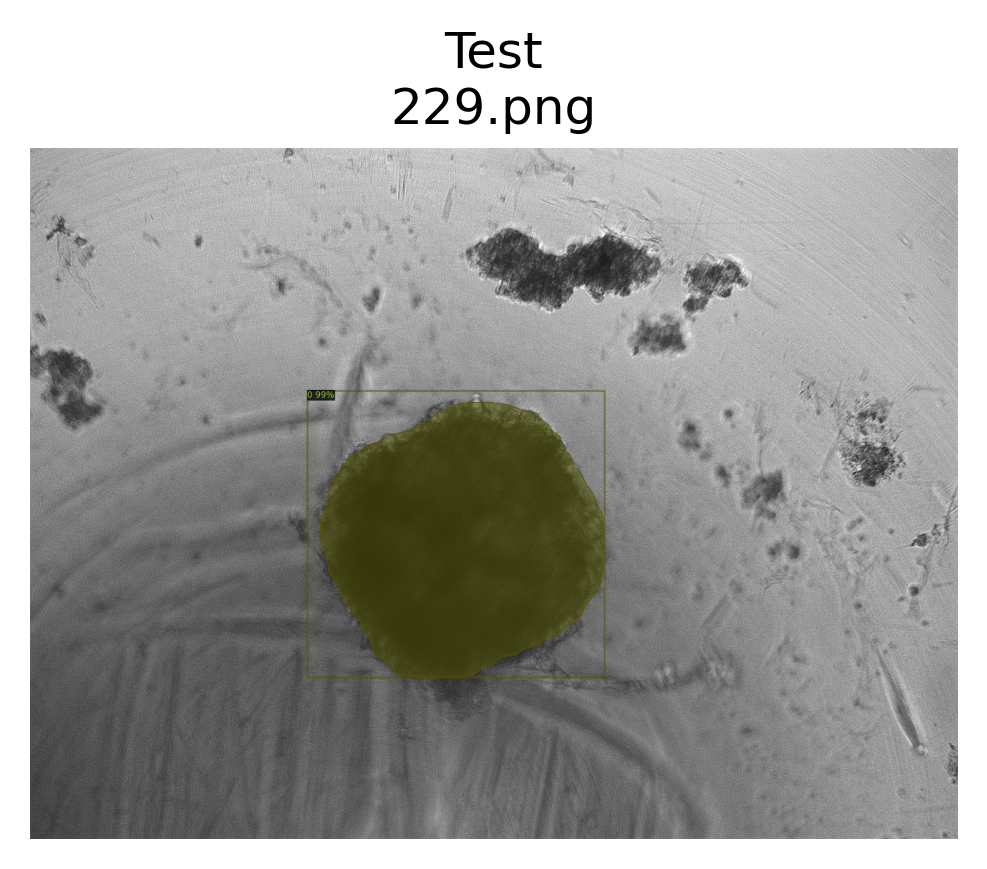

ddict info:
	path: ceia/src/datasets/imagen/229.png
	num_instances: 1


In [32]:
img_path = Path(root,'imagen', '229.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image


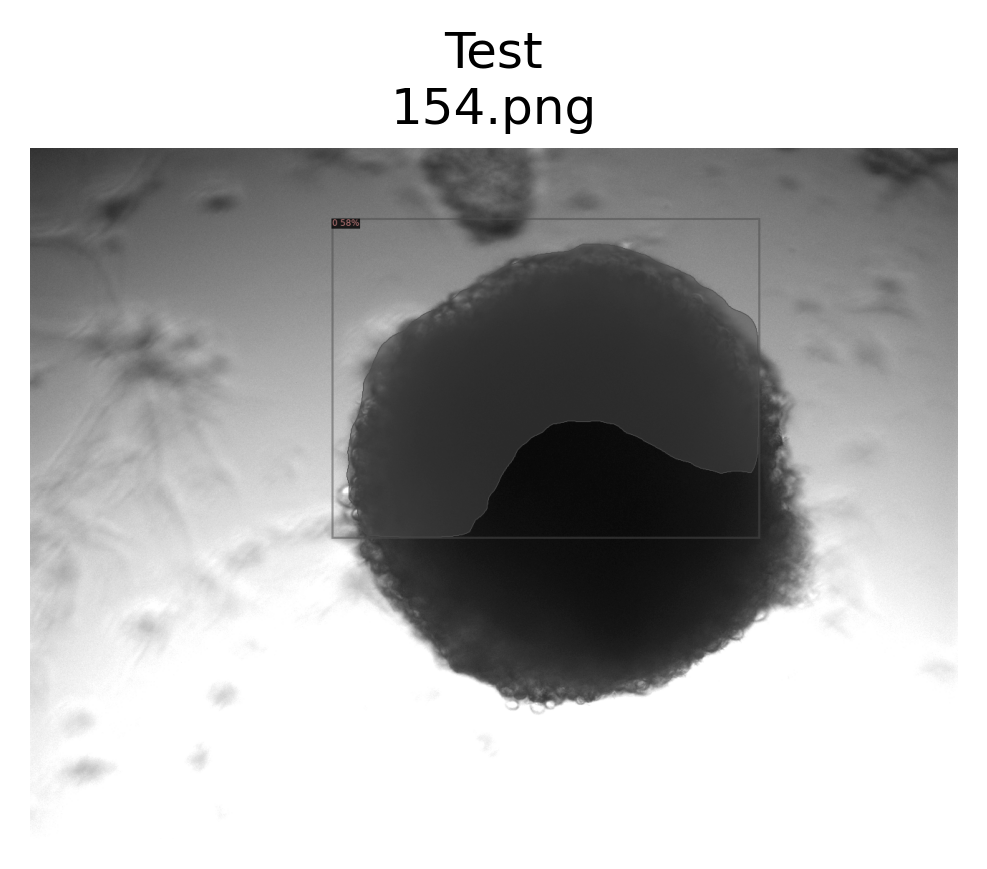

ddict info:
	path: ceia/src/datasets/imagen/154.png
	num_instances: 1


In [33]:
img_path = Path(root,'imagen', '154.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image

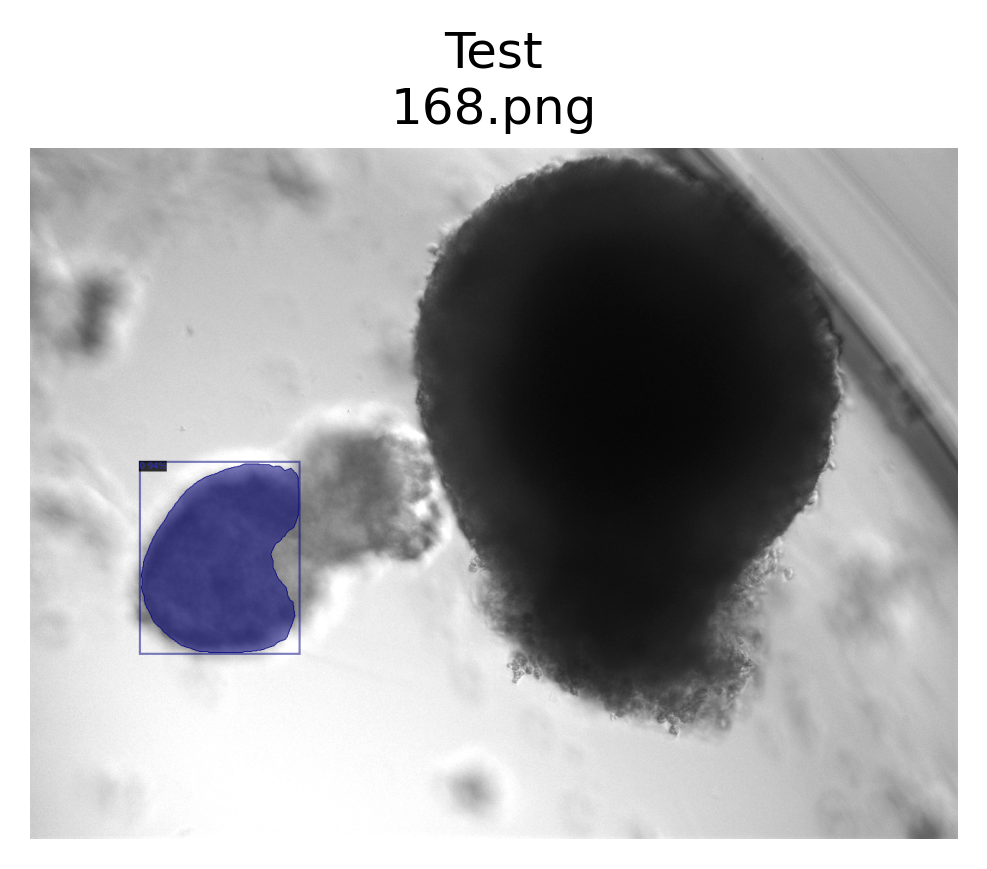

ddict info:
	path: ceia/src/datasets/imagen/168.png
	num_instances: 1


In [34]:
img_path = Path(root,'imagen', '168.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image

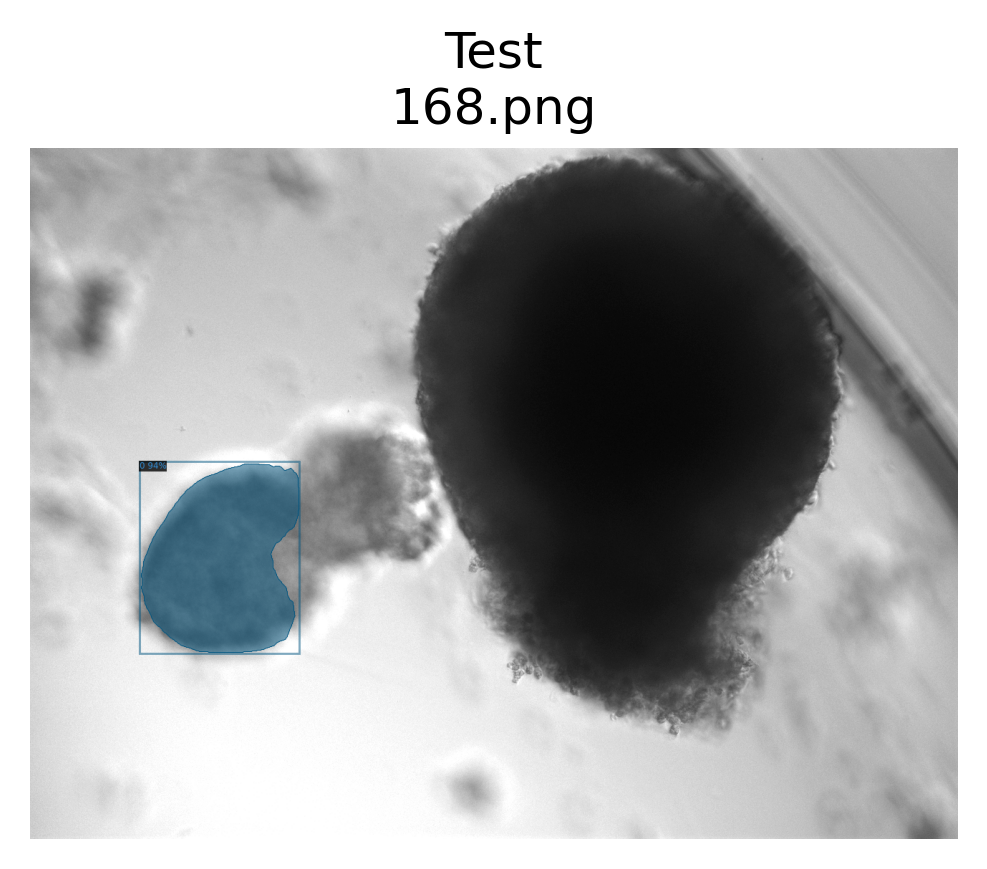

ddict info:
	path: ceia/src/datasets/imagen/168.png
	num_instances: 1


In [35]:
img_path = Path(root,'imagen', '168.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image

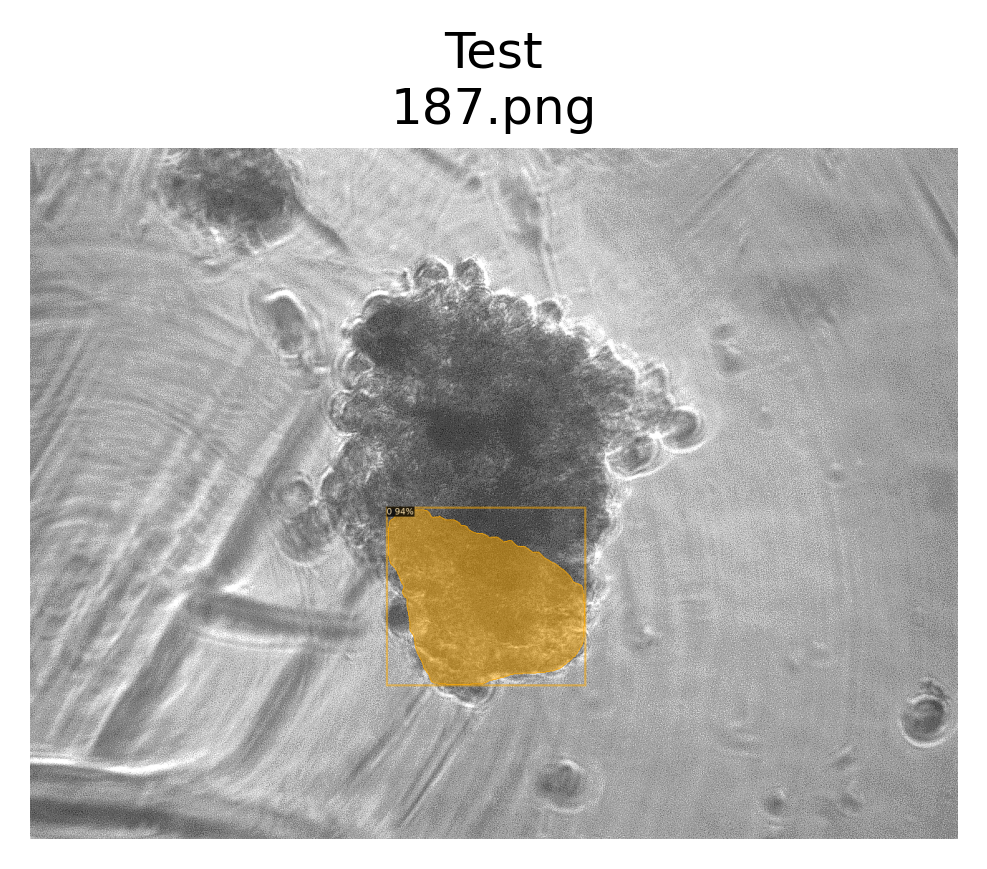

ddict info:
	path: ceia/src/datasets/imagen/187.png
	num_instances: 1


In [36]:
img_path = Path(root,'imagen', '187.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image

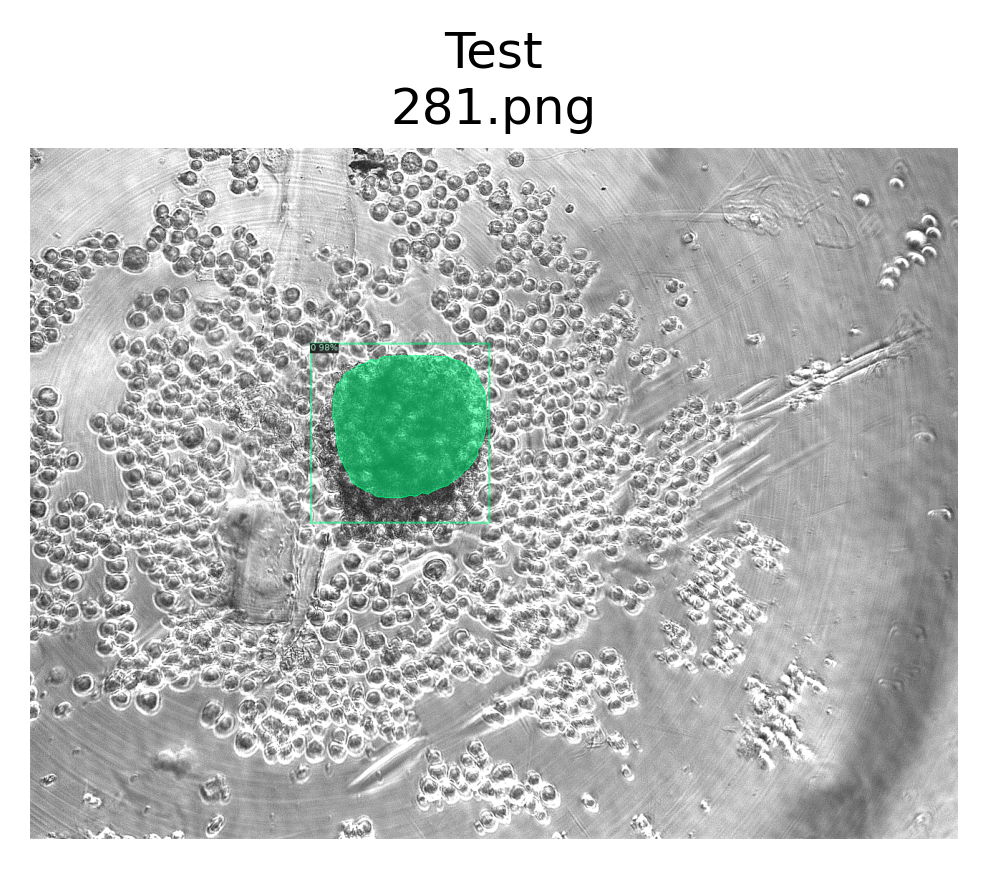

ddict info:
	path: ceia/src/datasets/imagen/281.png
	num_instances: 1


In [37]:
img_path = Path(root,'imagen', '281.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image

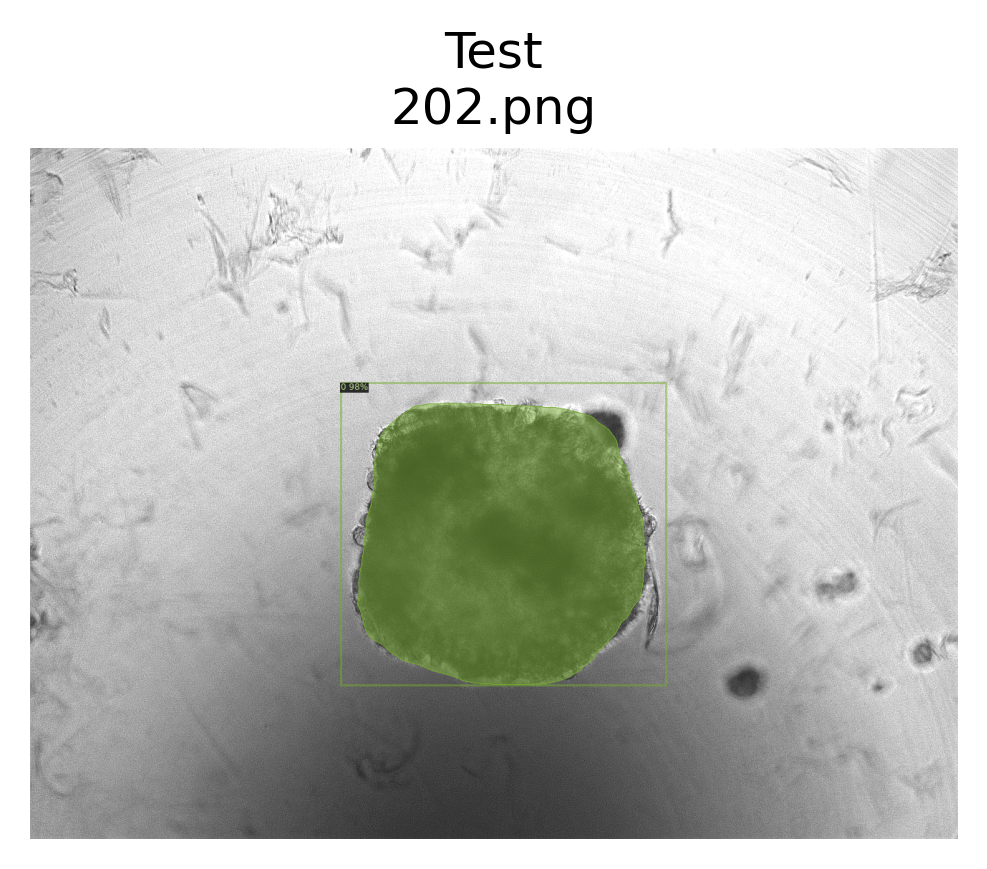

ddict info:
	path: ceia/src/datasets/imagen/202.png
	num_instances: 1


In [38]:
img_path = Path(root,'imagen', '202.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image

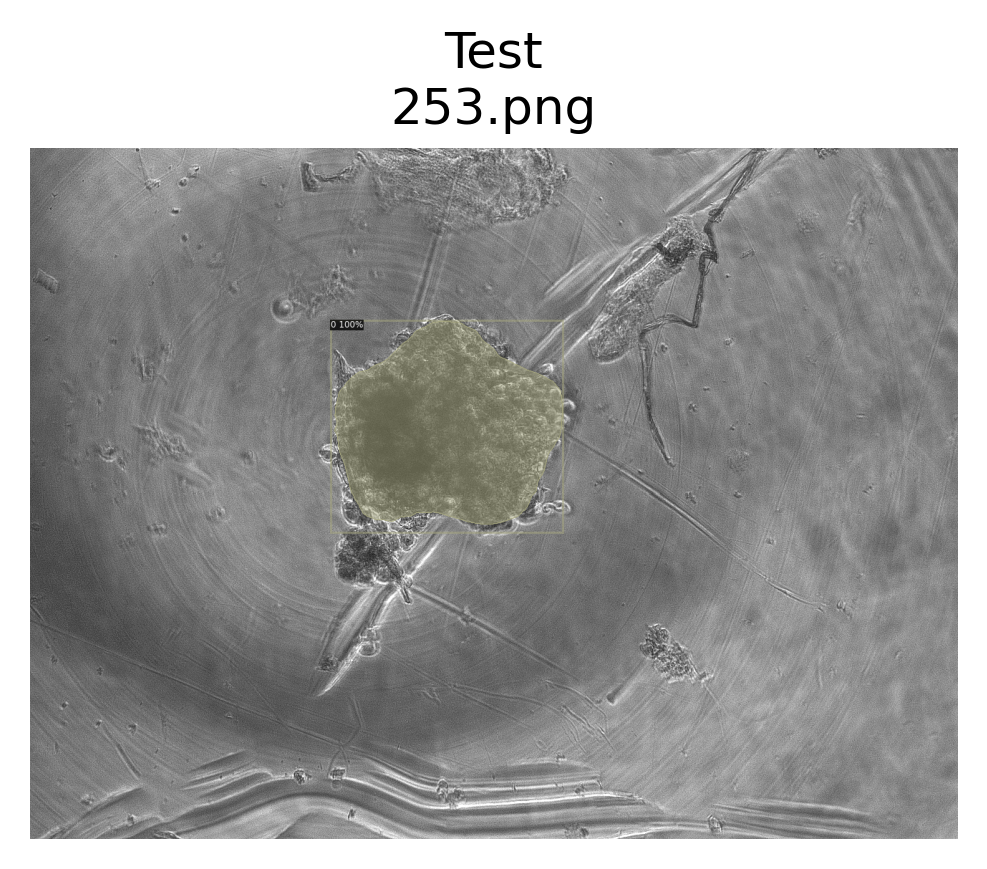

ddict info:
	path: ceia/src/datasets/imagen/253.png
	num_instances: 1


In [39]:
img_path = Path(root,'imagen', '253.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image

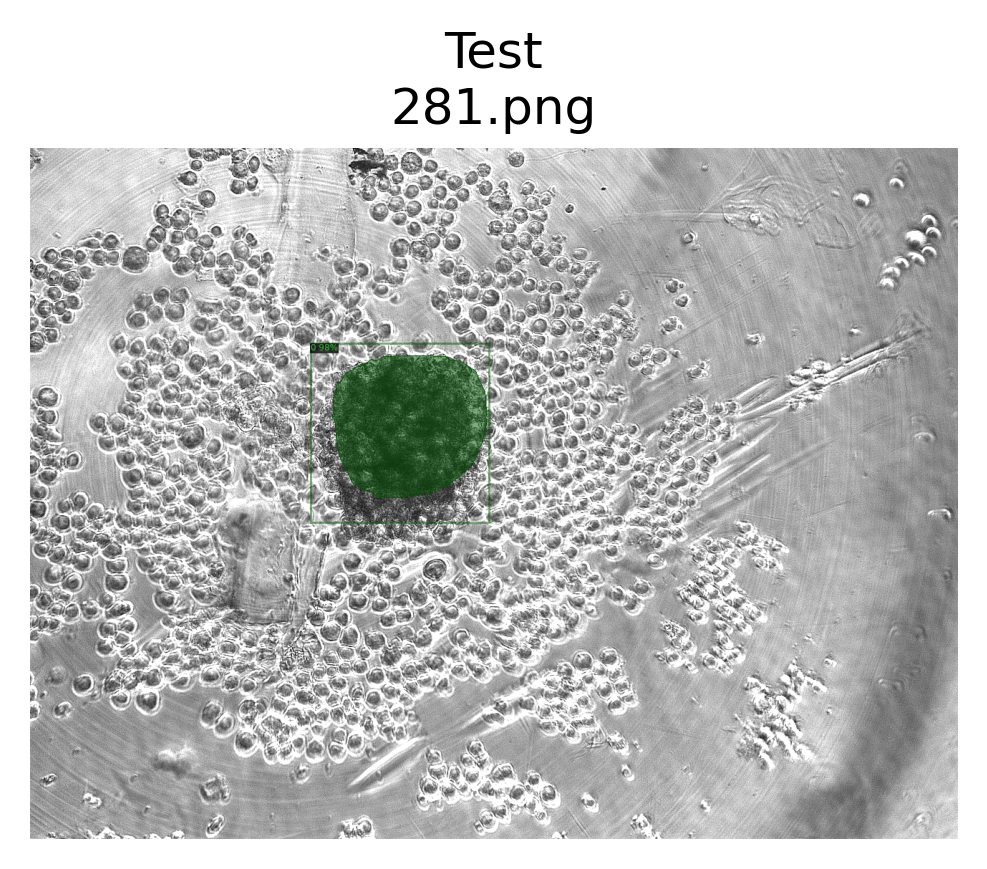

ddict info:
	path: ceia/src/datasets/imagen/281.png
	num_instances: 1


In [40]:
img_path = Path(root,'imagen', '281.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image

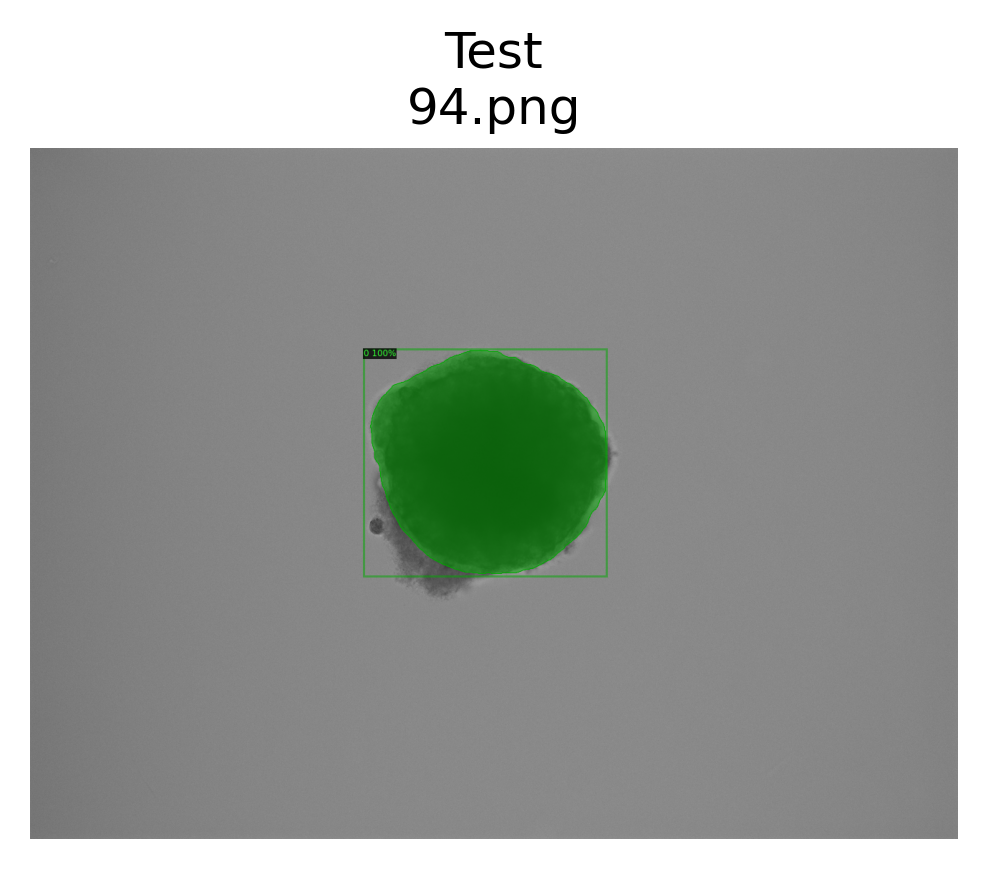

ddict info:
	path: ceia/src/datasets/imagen/94.png
	num_instances: 1


In [41]:
img_path = Path(root,'imagen', '94.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image

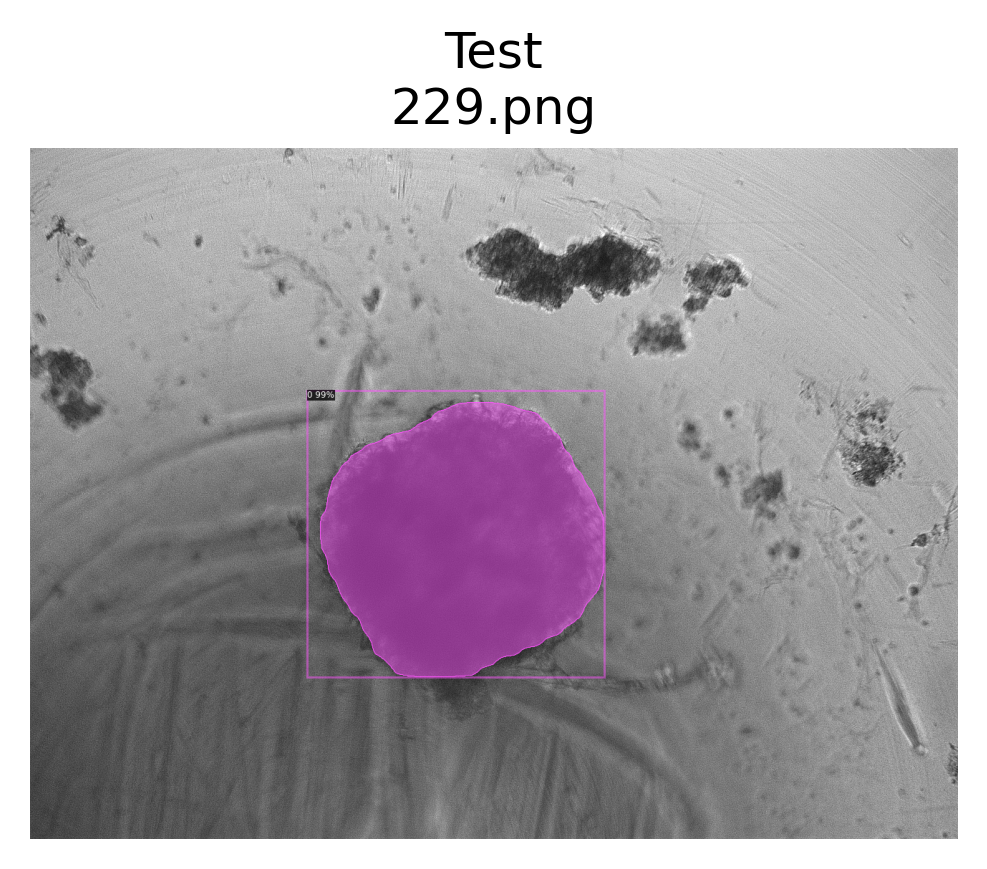

ddict info:
	path: ceia/src/datasets/imagen/229.png
	num_instances: 1


In [42]:
img_path = Path(root,'imagen', '229.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image

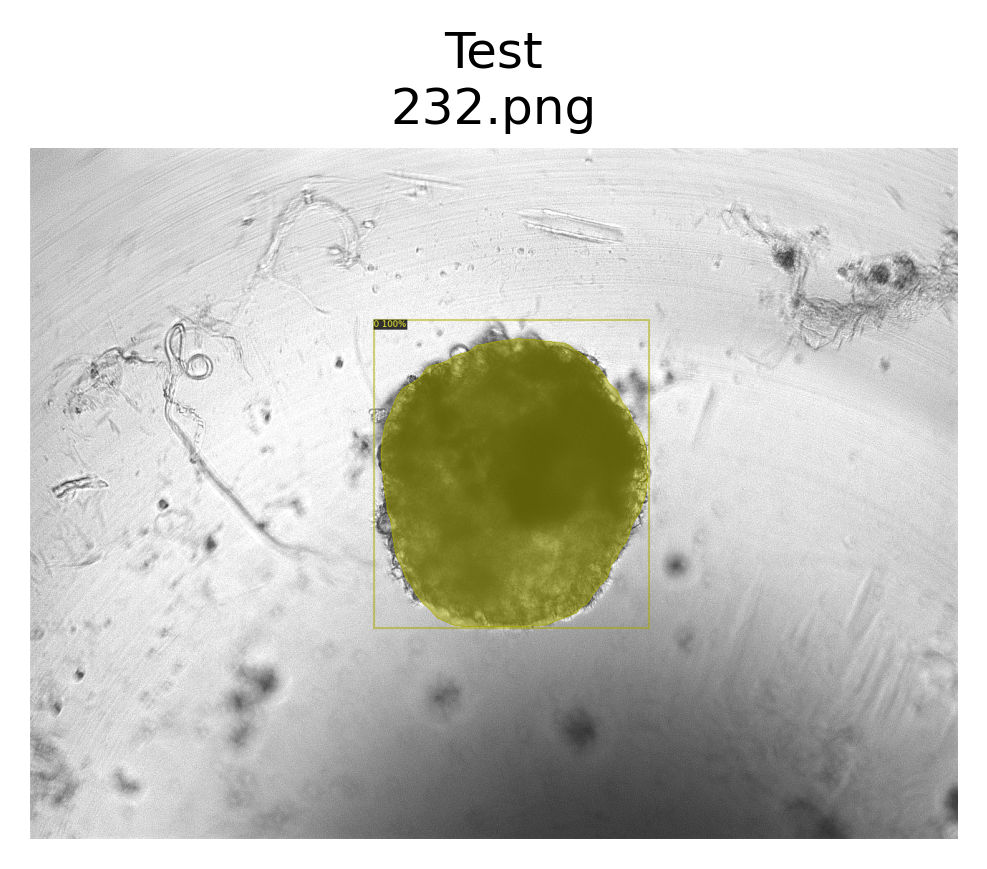

ddict info:
	path: ceia/src/datasets/imagen/232.png
	num_instances: 1


In [43]:
img_path = Path(root,'imagen', '232.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image